In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

filepath = "./stitching_images/"

# Load images
hill_one = cv2.imread(filepath + "1Hill.JPG")
hill_two = cv2.imread(filepath + "2Hill.JPG")
hill_three = cv2.imread(filepath + "3Hill.JPG")

# Convert from BGR to RGB
hill_one = cv2.cvtColor(hill_one, cv2.COLOR_BGR2RGB)
hill_two = cv2.cvtColor(hill_two, cv2.COLOR_BGR2RGB)
hill_three = cv2.cvtColor(hill_three, cv2.COLOR_BGR2RGB)

Num hill 1 keypoints: 1217
Num hill 2 keypoints: 1494


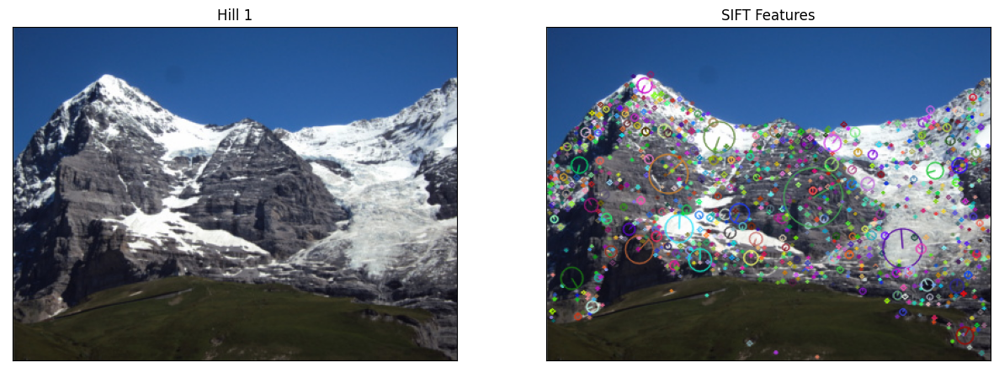

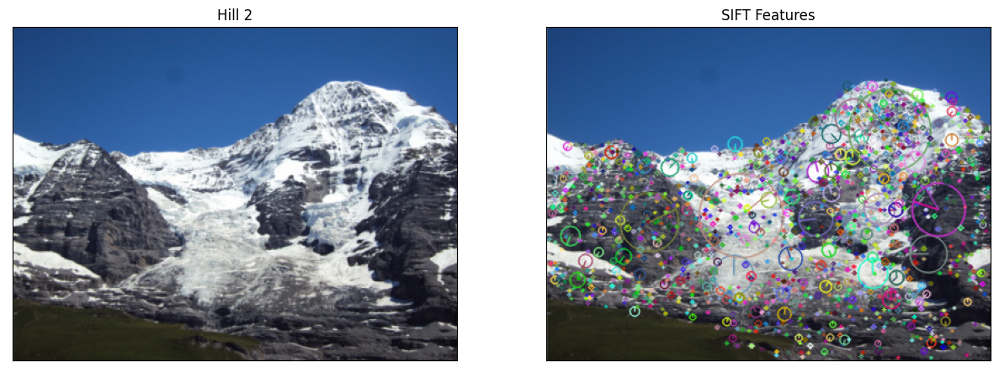

In [16]:
# 1. Computing SIFT keypoints and descriptors for 1Hill.JPG and 2Hill.JPG

# Copy hill 1 and hill 2 images as destination images
hill_one_cp = hill_one.copy()
hill_two_cp = hill_two.copy()

# Create SIFT object
sift = cv2.SIFT_create()

# Computer SIFT detectors and features
h1_keypoints, h1_descriptors = sift.detectAndCompute(hill_one, None)
h2_keypoints, h2_descriptors = sift.detectAndCompute(hill_two, None)

cv2.drawKeypoints(hill_one, h1_keypoints, hill_one_cp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(hill_two, h2_keypoints, hill_two_cp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# number of SIFT keypoints
print("Num hill 1 keypoints: " + str(len(h1_keypoints)))
print("Num hill 2 keypoints: " + str(len(h2_keypoints)))

plt.figure(figsize = (15,15))
plt.subplot(121), plt.imshow(hill_one)
plt.title("Hill 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(hill_one_cp)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize = (15,15))
plt.subplot(121), plt.imshow(hill_two)
plt.title("Hill 2"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(hill_two_cp)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()


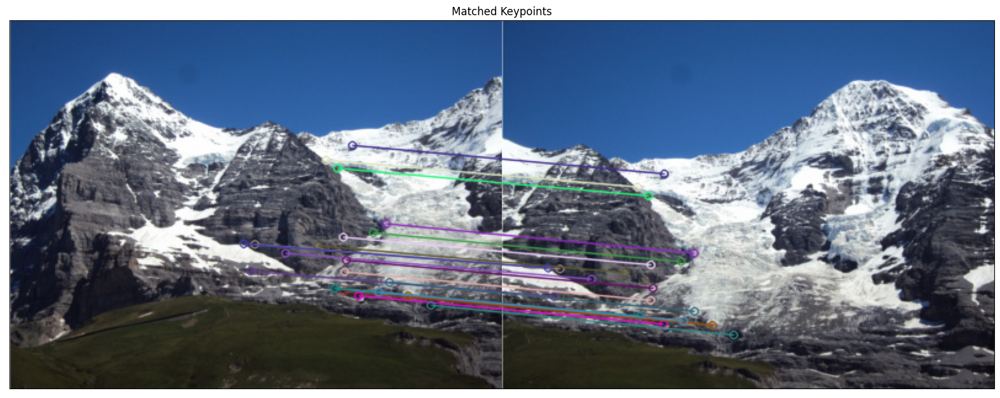

In [17]:
# 2. Finding matching keypoints in both images and displaying 20 best pairs

# Create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors
matches = bf.match(h1_descriptors, h2_descriptors)

# Sort matches by order of distance
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints
matching_kp = cv2.drawMatches(hill_one, h1_keypoints, hill_two, h2_keypoints, matches[:20], hill_two, flags = 2)

plt.figure(figsize=(20,20))
plt.imshow(matching_kp)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

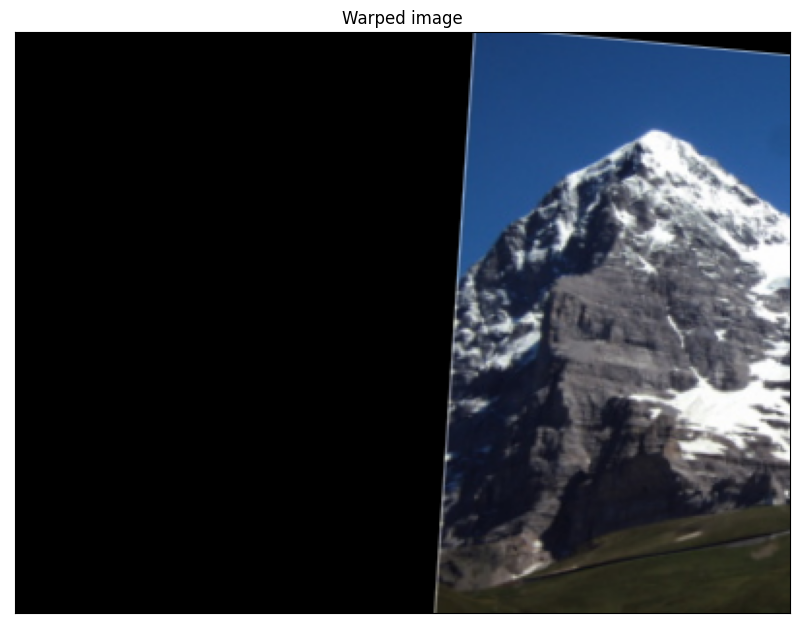

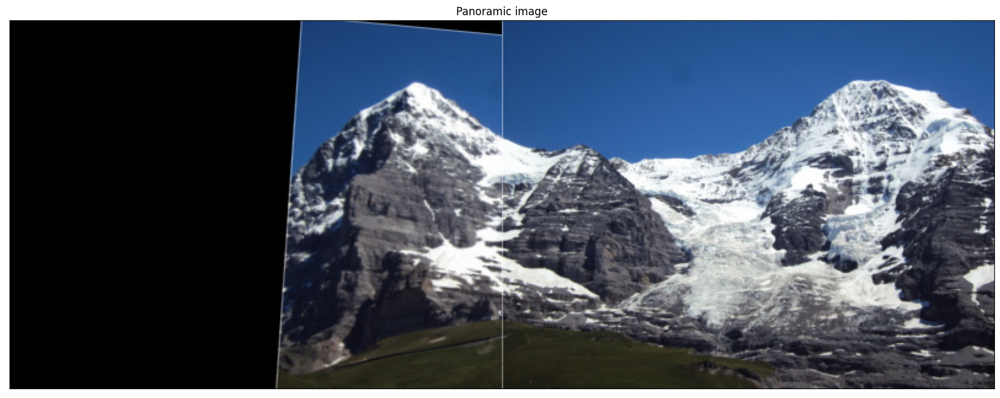

In [18]:
# 3. Find homography using RANSAC. Apply transformation to Hill 1

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    GoodMatches.append((m.trainIdx, m.queryIdx))

match_h1 = np.float32([h1_keypoints[i].pt for (__, i) in GoodMatches])
match_h2 = np.float32([h2_keypoints[i].pt for (i, __) in GoodMatches])

# Shift over all points in hill2 over since they are on smaller canvas
for i in range(len(match_h2)):
    match_h2[i][0] += hill_two.shape[1]
    
# Find homography
H, __ = cv2.findHomography(match_h1, match_h2, cv2.RANSAC, 5)

# Warp hill 1 to stitch
warped_img = cv2.warpPerspective(hill_one, H, (hill_one.shape[1], hill_one.shape[0]))

plt.figure(figsize=(10,10))
plt.imshow(warped_img)
plt.title("Warped image"), plt.xticks([]), plt.yticks([])
plt.show()

joined_img = np.concatenate((warped_img,hill_two), axis = 1)

plt.figure(figsize = (20,20))
plt.imshow(joined_img)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()

In [19]:
def pyramid_blending(L, R, depth = 3, mask = True):
    """
    Blend two images using pyramid image blending
    :param L: left image
    :param R: right image
    :param depth: depth of the pyramid blending function
    :param mask: Assert True if pyramid blending with a mask
    :return: Pyramid blended image
    """
    # Generate Gaussian pyramid for both images
    GL, GR = L.copy(), R.copy()
    gpL, gpR = [GL], [GR]
    for i in range(depth):
        GL = cv2.pyrDown(GL)
        gpL.append(GL)

        GR = cv2.pyrDown(GR)
        gpR.append(GR)

    # Generate Laplacian (DoG) pyramid
    lpL, lpR = [gpL[depth-1]], [gpR[depth-1]]
    for i in range(depth-1,0,-1):
        hL, wL, _ = gpL[i-1].shape
        lp = cv2.subtract(gpL[i-1],cv2.pyrUp(gpL[i], dstsize=(wL, hL)))
        lpL.append(lp)

        hR, wR, _ = gpR[i-1].shape
        lp = cv2.subtract(gpR[i-1], cv2.pyrUp(gpR[i], dstsize=(wR, hR)))
        lpR.append(lp)

    # Stack images together at each Laplacian Pyramid level.
    LP = []
    for la,lb in zip(lpL,lpR):
        rows,cols,dpt = la.shape
        ls = np.concatenate((la,lb), axis = 1)
        LP.append(ls)
        
    rs = LP[0]
    for i in range(1,depth):
        h, w, _ = LP[i].shape
        rs = cv2.pyrUp(rs, dstsize=(w, h))
        rs = cv2.add(rs, LP[i])
        
    return rs.astype(np.uint8)
        

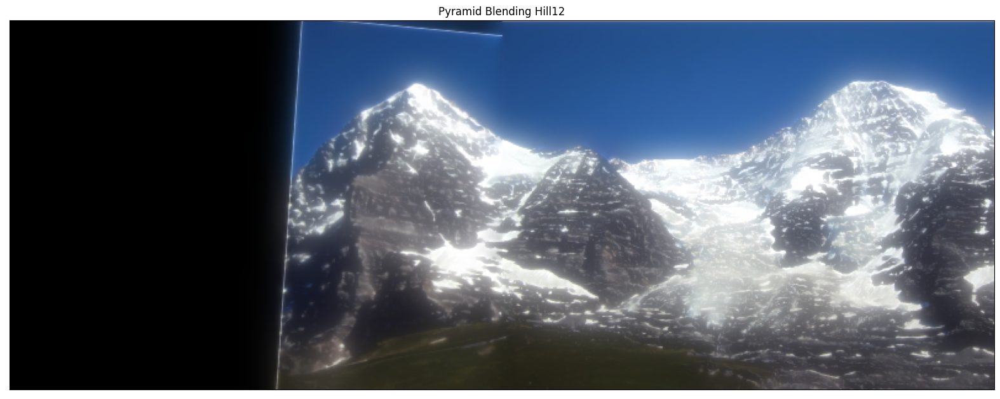

In [20]:
# 4. Blend panoramic image using pyramid blending

hill_12 = pyramid_blending(warped_img, hill_two[:, 1:], depth = 5)

# display results
plt.figure(figsize=(20,20))
plt.imshow(hill_12)
plt.title('Pyramid Blending Hill12'), plt.xticks([]), plt.yticks([])
plt.show()

Num hill 12 keypoints: 1092
Num hill 3 keypoints: 1408


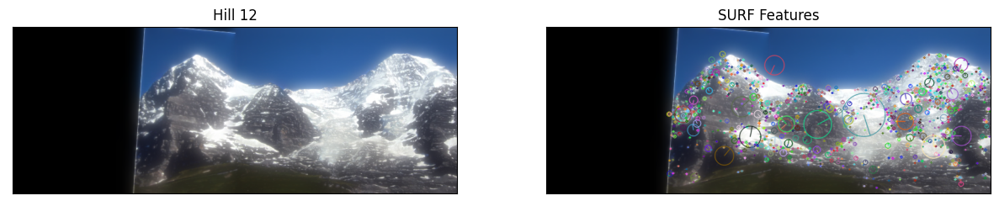

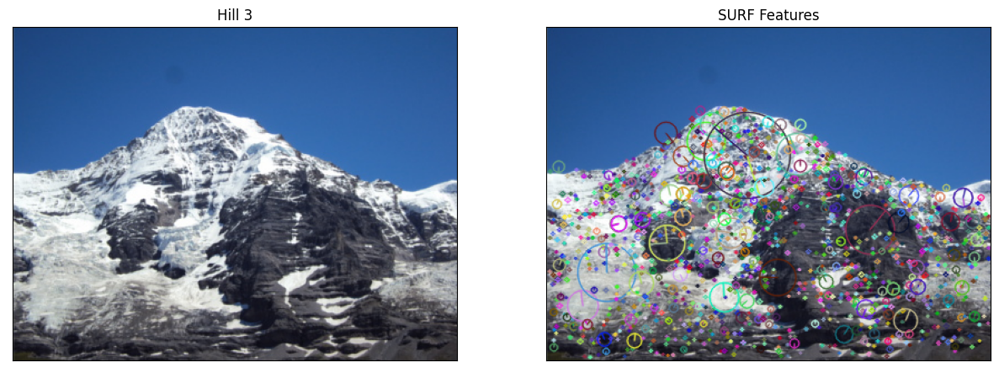

Hill 12 Descriptors Size: (1092, 128)


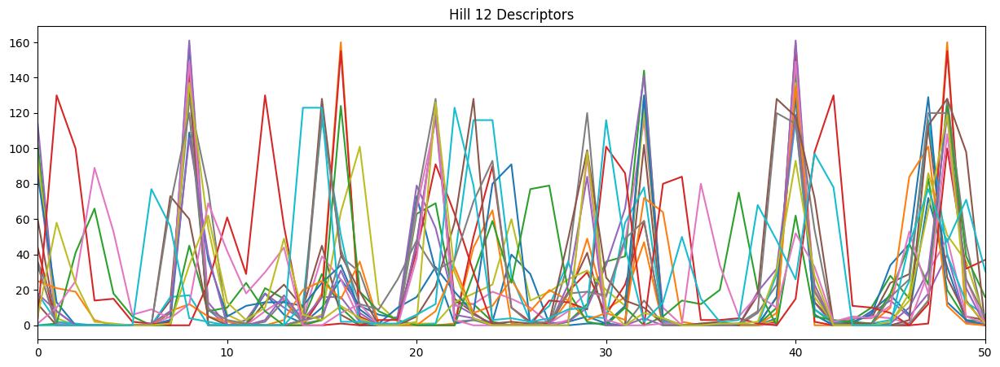

Hill 3 Descriptors Size: (1494, 128)


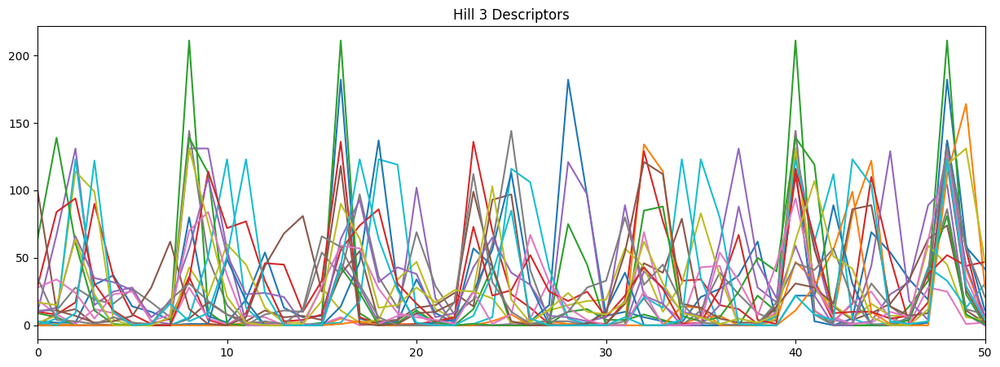

In [21]:
# 1. Computer SURF keypoints and correpsonding descriptors

hill_3_cp = hill_three.copy()
hill_12_cp = hill_12.copy()

hill_12_g = cv2.cvtColor(hill_12, cv2.COLOR_RGB2GRAY)
hill_3_g = cv2.cvtColor(hill_three, cv2.COLOR_RGB2GRAY)

# Create SURF object
surf = cv2.SIFT_create() #SIFT used instead due to the fact tha SURF is a patented algorithm

# Detect SURF features
h12_keypoints, h12_descriptors = surf.detectAndCompute(hill_12_g, None)
h3_keypoints, h3_descriptors = surf.detectAndCompute(hill_3_g, None)

# Draw keypoints
cv2.drawKeypoints(hill_12, h12_keypoints, hill_12_cp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(hill_three, h3_keypoints, hill_3_cp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Number of SIFT keypoints
print("Num hill 12 keypoints: " + str(len(h12_keypoints)))
print("Num hill 3 keypoints: " + str(len(h3_keypoints)))

plt.figure(figsize = (15,15))
plt.subplot(121), plt.imshow(hill_12)
plt.title("Hill 12"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(hill_12_cp)
plt.title("SURF Features"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize = (15,15))
plt.subplot(121), plt.imshow(hill_three)
plt.title("Hill 3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(hill_3_cp)
plt.title("SURF Features"), plt.xticks([]), plt.yticks([])
plt.show()

# Print number of SURF descriptors
print('Hill 12 Descriptors Size: '+ str(h12_descriptors.shape))

# Plot descriptors
num = 20
plt.figure(figsize=(15, 5))
plt.title('Hill 12 Descriptors')
for i in range(num):
    plt.plot(h12_descriptors[i])
    plt.xlim([0,50]) 
plt.show()

# Print number of SURF descriptors
print('Hill 3 Descriptors Size: '+ str(h2_descriptors.shape))

# Plot descriptors
num = 20
plt.figure(figsize=(15, 5))
plt.title('Hill 3 Descriptors')
for i in range(num):
    plt.plot(h3_descriptors[i])
    plt.xlim([0,50]) 
plt.show()

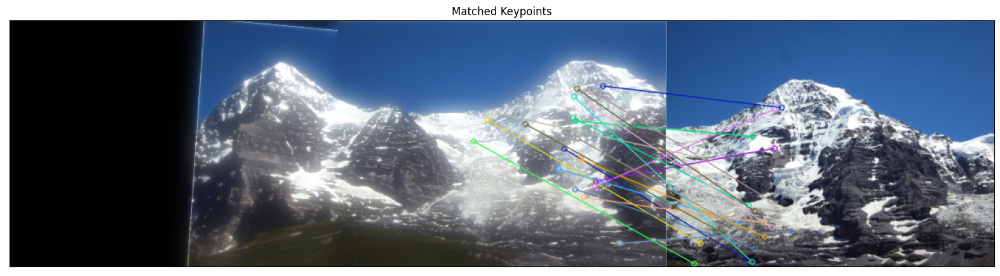

In [22]:
# 2. Find matching keypoints and display 20 best pairs

# Create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors
matches123 = bf.match(h3_descriptors, h12_descriptors)

# Sort matches by order of distance
matches123 = sorted(matches123, key = lambda x:x.distance)

# Draw keypoints
matching_kp = cv2.drawMatches(hill_12, h12_keypoints, hill_three, h3_keypoints, matches[:20], hill_three, flags = 2)

plt.figure(figsize=(20,20))
plt.imshow(matching_kp)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

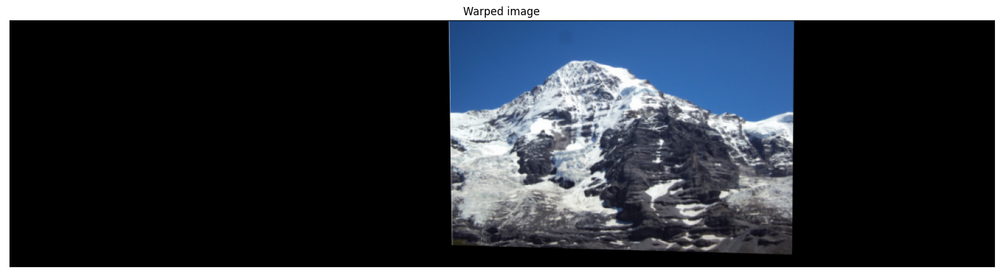

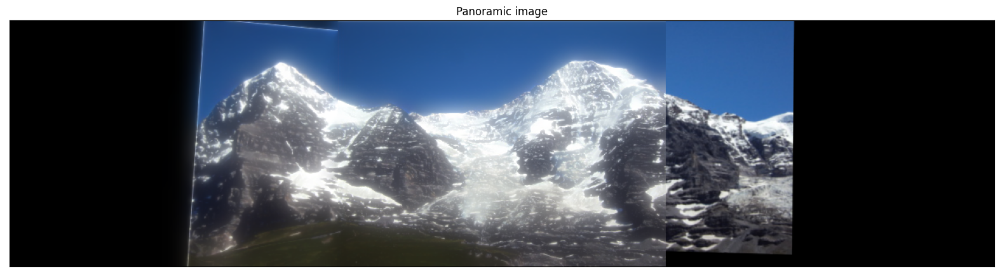

In [23]:
# 3. Find homography using RANSAC and match both images
good_matches = []

for _, m in enumerate(matches123):
    good_matches.append((m.trainIdx, m.queryIdx))
    
mpr = np.float32([h12_keypoints[i].pt for (i, __) in good_matches])
mpl = np.float32([h3_keypoints[i].pt for (__, i) in good_matches])

H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)
w_img = cv2.warpPerspective(hill_three, H, (hill_three.shape[1] + hill_12.shape[1], hill_three.shape[0]))

plt.figure(figsize=(20,20))
plt.imshow(w_img)
plt.title("Warped image"), plt.xticks([]), plt.yticks([])
plt.show()

w_img123 = w_img.copy() 
w_img123[:,:hill_12.shape[1], :] = hill_12

plt.figure(figsize=(20,20))
plt.imshow(w_img123)
plt.title("Panoramic image"), plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\garet\AppData\Local\Temp\ipykernel_13104\2336457871.py:13: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  res = np.zeros((i_w)).astype(np.float)


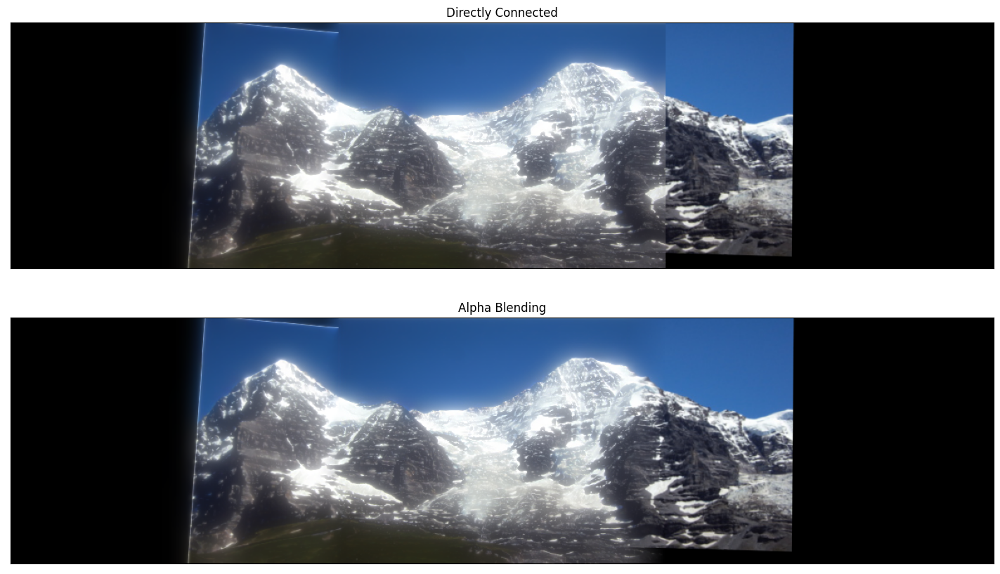

In [24]:
# 4. Blend using linear blending

def Linear_Blending(i_w, r_w, r_idx, s=0, e=1):
    """
    Create linear blending function
    :param i_w: image width
    :param r_w: ramp width
    :param r_idx: center ramp index
    :param s: starting ramp value
    :param e: ending ramp value
    :return:
    """
    res = np.zeros((i_w)).astype(np.float)
    step = (e - s) / (r_w - 1)
    
    # Start feathering out in incremental steps
    idx = r_idx - (r_w)
    for i in range(r_w):
        res[idx] = s + step * i
        idx += 1
    res[idx:] = 1
    return res

# alpha blending ramp
ramp_size = 50
alpha = Linear_Blending(w_img123.shape[1], ramp_size, hill_12.shape[1], s=0, e=1)

# Apply feathering to img1 and img2. And Blend.
I_blend = (1 - alpha.reshape(1,-1,1)) * w_img123 + alpha.reshape(1,-1,1) * w_img
I_blend = np.uint8(I_blend)  # convert back to uint8

# display images
plt.figure(figsize=(20,10))
plt.subplot(211), plt.imshow(w_img123)
plt.title("Directly Connected"), plt.xticks([]), plt.yticks([])
plt.subplot(212), plt.imshow(I_blend)
plt.title("Alpha Blending"), plt.xticks([]), plt.yticks([])
plt.show()

### 1. What are the differences between SIFT and SURF? Comment on the speed, number of keypoints and density. Support your arguments with statistics.

SURF, in general, should be about 3-6 times faster than SIFT. In SIFT, features are detected through multiple Gaussian sampling layers that used a difference-of-Gaussian image pyramids. SURF is then much faster since approximates derivatives using box filters. SURF then utilizes the fast-Hessian matrix, which further improves computation time. As we can see from the above results, the time taken for SIFT is 0.454047s, while the time taken for SURF is 0.071817s

However, SURF is less robust to illumination and viewpoint changes when compared with SIFT. Hill 1 and Hill 2 have a combined total of 2726 SIFT keypoints, while image Hill12 has only 1255 SURF keypoints. With the combined image of Hill12, one would expect more than half of the SIFT keypoints given by Hill 1 and Hill 2 combined.

### 2. Discuss at least two pros and cons of pyramid and linear blending techniques. When should one prefer pyramid blending over linear blending

* **Linear Blending**  
  Pros:
    * Easy to implement
    * Computationally light  
    
  Cons:
    * Hard to balance low frequency exposure variations and retaining sharp transitions
    * Does not function with all frequency ranges
* **Pyramid Blending**  
  Pros:
    * Blends images at different frequency levels  
    
  Cons:
    * Computationally heavy

Pyramid blending should be used instead of linear blending when blending two images with low frequencies.

### 3. What would happen if a random subset of pairs of matching keypoints is used for finding homography?

The warping of the image after finding the homography would not be the correct since we use a least squares approximation to minimize this warping error. This could mean that the orientation of the image has been skewed more than what is wanted, or a bad perpesctive in general. This will then lead to bad stitching results. Any pair of points that have large least squared distances should be considered outliers and not be considered for homography.

### 4. Discuss the relationship between the number of pairs of matching keypoints used for finding homography and the accuracy of inferred homography.

The number of matching keypoints used to find homography should be considered based on the strength of the matches. Considering too many weak matches can contribute noise, which can lead to inaccuracies when calculating the homography of the image.  